In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
import os
import sys
import numpy as np
import pandas as pd
import re
import cv2
import matplotlib.pyplot as plt
import tensorflow as tf
from tqdm import tqdm
from keras import backend as K
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import KFold
import time

# DE-Net

In [ ]:
def HCDC(inputTensor, numFilters, kernelSize = 3):
  x = tf.keras.layers.Conv2D(filters = 512, dilation_rate=(1, 1), strides=(1,1),  kernel_size = (3, 3), padding = 'same')(inputTensor)
  x = tf.keras.layers.BatchNormalization()(x)
  x =tf.keras.layers.Activation('relu')(x)

  x2 = tf.keras.layers.Conv2D(filters = 512, dilation_rate=(2, 2), strides=(1,1),  kernel_size = (3, 3), padding = 'same')(x)
  x2 = tf.keras.layers.BatchNormalization()(x2)
  x2 =tf.keras.layers.Activation('relu')(x2)

  x3 = tf.keras.layers.Conv2D(filters = 512, dilation_rate=(5, 5), strides=(1,1),  kernel_size = (3, 3), padding = 'same')(x2)
  x3 = tf.keras.layers.BatchNormalization()(x3)
  x3 =tf.keras.layers.Activation('relu')(x3)

  x4 = tf.keras.layers.Conv2D(filters = 512, dilation_rate=(7, 7), strides=(1,1),  kernel_size = (3, 3), padding = 'same')(x3)
  x4 = tf.keras.layers.BatchNormalization()(x4)
  x4 =tf.keras.layers.Activation('relu')(x4)

  sum = tf.keras.layers.add([x, x2, x3, x4]) # Element-wise summation
  return sum

In [ ]:
def Conv2dBlock(inputTensor, numFilters, kernelSize = 3, doBatchNorm = True):
  x = tf.keras.layers.Conv2D(filters = numFilters, kernel_size = (kernelSize, kernelSize), kernel_initializer = 'he_normal', padding = 'same') (inputTensor)
  if doBatchNorm: 
    x = tf.keras.layers.BatchNormalization()(x)
  x =tf.keras.layers.Activation('relu')(x)
  return x

# Defining Network 
def GiveMeDEnet(inputImage, numFilters = 64, droupouts = 0.1, doBatchNorm = True):
    # Dilated Feature Encoder
    # 1st Conv Block
    c1 = Conv2dBlock(inputImage, numFilters * 1, kernelSize = 3, doBatchNorm = doBatchNorm)
    c1 = Conv2dBlock(c1, numFilters * 1, kernelSize = 3, doBatchNorm = doBatchNorm)
    p1 = tf.keras.layers.MaxPooling2D((2,2))(c1)

    # 2nd Conv Block
    c2 = Conv2dBlock(p1, numFilters * 2, kernelSize = 3, doBatchNorm = doBatchNorm)
    c2 = Conv2dBlock(c2, numFilters * 2, kernelSize = 3, doBatchNorm = doBatchNorm)
    p2 = tf.keras.layers.MaxPooling2D((2,2))(c2)

    # 3rd Conv Block
    c3 = Conv2dBlock(p2, numFilters * 4, kernelSize = 3, doBatchNorm = doBatchNorm)
    c3 = Conv2dBlock(c3, numFilters * 4, kernelSize = 3, doBatchNorm = doBatchNorm)
    c3 = Conv2dBlock(c3, numFilters * 4, kernelSize = 3, doBatchNorm = doBatchNorm)
    p3 = tf.keras.layers.MaxPooling2D((2,2))(c3)

    # 4th Conv Block
    c4 = Conv2dBlock(p3, numFilters * 8, kernelSize = 3, doBatchNorm = doBatchNorm)
    c4 = Conv2dBlock(c4, numFilters * 8, kernelSize = 3, doBatchNorm = doBatchNorm)
    c4 = Conv2dBlock(c4, numFilters * 8, kernelSize = 3, doBatchNorm = doBatchNorm)

    #  HCDC Block
    hcdc = HCDC(c4, numFilters * 8, kernelSize = 3)
    
    # Feature Decoder
    c6 = tf.keras.layers.Conv2D(filters = numFilters * 4, kernel_size = (1, 1), kernel_initializer = 'he_normal', padding = 'same')(hcdc)
    c6 = tf.keras.layers.Conv2DTranspose(numFilters*4, (4, 4), strides = (1, 1), padding = 'same')(c6)
    c6 = tf.keras.layers.BatchNormalization()(c6)
    c6 = tf.keras.layers.Activation('relu')(c6)
    u6 = tf.keras.layers.concatenate([c6, hcdc])

    c7 = tf.keras.layers.Conv2D(filters = numFilters * 4, kernel_size = (1, 1), kernel_initializer = 'he_normal', padding = 'same')(c6)
    c7 = tf.keras.layers.Conv2DTranspose(numFilters*4, (4, 4), strides = (1, 1), padding = 'same')(c7)
    c7 = tf.keras.layers.BatchNormalization()(c7)
    c7 = tf.keras.layers.Activation('relu')(c7)
    c7 = tf.keras.layers.concatenate([c7, c4])

    c8 = tf.keras.layers.Conv2D(filters = numFilters * 4, kernel_size = (1, 1), kernel_initializer = 'he_normal', padding = 'same')(c7)
    c8 = tf.keras.layers.Conv2DTranspose(numFilters*4, (4, 4), strides = (2, 2), padding = 'same')(c8)
    c8 = tf.keras.layers.BatchNormalization()(c8)
    c8 = tf.keras.layers.Activation('relu')(c8)
    c8 = tf.keras.layers.concatenate([c8, c3])

    c9 = tf.keras.layers.Conv2D(filters = 64, kernel_size = (1, 1), kernel_initializer = 'he_normal', padding = 'same')(c8)
    c9 = tf.keras.layers.Conv2DTranspose(64, (4, 4), strides = (2, 2), padding = 'same')(c9)
    c9 = tf.keras.layers.BatchNormalization()(c9)
    c9 = tf.keras.layers.Activation('relu')(c9)
    c9 = tf.keras.layers.concatenate([c9, c2])

    c10 = tf.keras.layers.Conv2D(filters = 32, kernel_size = (1, 1), kernel_initializer = 'he_normal', padding = 'same')(c9)
    c10 = tf.keras.layers.Conv2DTranspose(32, (4, 4), strides = (2, 2), padding = 'same')(c10)
    c10 = tf.keras.layers.BatchNormalization()(c10)
    c10 = tf.keras.layers.Activation('relu')(c10)
    c10 = tf.keras.layers.concatenate([c10, c1])

    output = tf.keras.layers.Conv2D(1, (1, 1), activation = 'sigmoid')(c10)
    model = tf.keras.Model(inputs = [inputImage], outputs = [output])
    return model

# U-Net

In [ ]:
# ------------------------------------------------ UNET ORIGINAL ---------------------

def Conv2dBlock(inputTensor, numFilters, kernelSize = 3, doBatchNorm = True):
    #first Conv
    x = tf.keras.layers.Conv2D(filters = numFilters, kernel_size = (kernelSize, kernelSize),
                              kernel_initializer = 'he_normal', padding = 'same') (inputTensor)
    if doBatchNorm:
        x = tf.keras.layers.BatchNormalization()(x)
    x =tf.keras.layers.Activation('relu')(x)
    
    #Second Conv
    x = tf.keras.layers.Conv2D(filters = numFilters, kernel_size = (kernelSize, kernelSize),
                              kernel_initializer = 'he_normal', padding = 'same') (x)
    if doBatchNorm:
        x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Activation('relu')(x)
    return x

# Defining Unet 
def GiveMeUnet(inputImage, numFilters = 64, droupouts = 0.1, doBatchNorm = True):
    # defining encoder Path
    c1 = Conv2dBlock(inputImage, numFilters * 1, kernelSize = 3, doBatchNorm = doBatchNorm)
    p1 = tf.keras.layers.MaxPooling2D((2,2))(c1)
    p1 = tf.keras.layers.Dropout(droupouts)(p1)

    c2 = Conv2dBlock(p1, numFilters * 2, kernelSize = 3, doBatchNorm = doBatchNorm)
    p2 = tf.keras.layers.MaxPooling2D((2,2))(c2)
    p2 = tf.keras.layers.Dropout(droupouts)(p2)
    
    c3 = Conv2dBlock(p2, numFilters * 4, kernelSize = 3, doBatchNorm = doBatchNorm)
    p3 = tf.keras.layers.MaxPooling2D((2,2))(c3)
    p3 = tf.keras.layers.Dropout(droupouts)(p3)
    
    c4 = Conv2dBlock(p3, numFilters * 8, kernelSize = 3, doBatchNorm = doBatchNorm)
    p4 = tf.keras.layers.MaxPooling2D((2,2))(c4)
    p4 = tf.keras.layers.Dropout(droupouts)(p4)
    
    #bottom
    c5 = Conv2dBlock(p4, numFilters * 16, kernelSize = 3, doBatchNorm = doBatchNorm)
    
    # defining decoder path
    u6 = tf.keras.layers.Conv2DTranspose(numFilters*8, (3, 3), strides = (2, 2), padding = 'same')(c5)
    u6 = tf.keras.layers.concatenate([u6, c4]) #
    u6 = tf.keras.layers.Dropout(droupouts)(u6)
    c6 = Conv2dBlock(u6, numFilters * 8, kernelSize = 3, doBatchNorm = doBatchNorm)
    
    u7 = tf.keras.layers.Conv2DTranspose(numFilters*4, (3, 3), strides = (2, 2), padding = 'same')(c6)
    u7 = tf.keras.layers.concatenate([u7, c3])
    u7 = tf.keras.layers.Dropout(droupouts)(u7)
    c7 = Conv2dBlock(u7, numFilters * 4, kernelSize = 3, doBatchNorm = doBatchNorm)
    
    u8 = tf.keras.layers.Conv2DTranspose(numFilters*2, (3, 3), strides = (2, 2), padding = 'same')(c7)
    u8 = tf.keras.layers.concatenate([u8, c2])
    u8 = tf.keras.layers.Dropout(droupouts)(u8)
    c8 = Conv2dBlock(u8, numFilters * 2, kernelSize = 3, doBatchNorm = doBatchNorm)
    
    u9 = tf.keras.layers.Conv2DTranspose(numFilters*1, (3, 3), strides = (2, 2), padding = 'same')(c8)
    u9 = tf.keras.layers.concatenate([u9, c1])
    u9 = tf.keras.layers.Dropout(droupouts)(u9)
    c9 = Conv2dBlock(u9, numFilters * 1, kernelSize = 3, doBatchNorm = doBatchNorm)
    
    output = tf.keras.layers.Conv2D(1, (1, 1), activation = 'sigmoid')(c9)
    model = tf.keras.Model(inputs = [inputImage], outputs = [output])
    return model

# Unet + VGG16

In [ ]:
# --------------------------------------------------------- Unet + VGG16 ---------------------------------------

def Conv2dBlock(inputTensor, numFilters, kernelSize = 3, doBatchNorm = True):
  x = tf.keras.layers.Conv2D(filters = numFilters, kernel_size = (kernelSize, kernelSize), kernel_initializer = 'he_normal', padding = 'same') (inputTensor)
  if doBatchNorm: 
    x = tf.keras.layers.BatchNormalization()(x)
  x =tf.keras.layers.Activation('relu')(x)
  return x

# Now defining Unet 
def GiveMeUnetWithVGG(inputImage, numFilters = 64, droupouts = 0.1, doBatchNorm = True):
    # 1st Conv Block
    c1 = Conv2dBlock(inputImage, numFilters * 1, kernelSize = 3, doBatchNorm = doBatchNorm)
    c1 = Conv2dBlock(c1, numFilters * 1, kernelSize = 3, doBatchNorm = doBatchNorm)
    p1 = tf.keras.layers.MaxPooling2D((2,2))(c1)
    
    # 2nd Conv Block
    c2 = Conv2dBlock(p1, numFilters * 2, kernelSize = 3, doBatchNorm = doBatchNorm)
    c2 = Conv2dBlock(c2, numFilters * 2, kernelSize = 3, doBatchNorm = doBatchNorm)
    p2 = tf.keras.layers.MaxPooling2D((2,2))(c2)
    
    # 3rd Conv Block
    c3 = Conv2dBlock(p2, numFilters * 4, kernelSize = 3, doBatchNorm = doBatchNorm)
    c3 = Conv2dBlock(c3, numFilters * 4, kernelSize = 3, doBatchNorm = doBatchNorm)
    c3 = Conv2dBlock(c3, numFilters * 4, kernelSize = 3, doBatchNorm = doBatchNorm)
    p3 = tf.keras.layers.MaxPooling2D((2,2))(c3)

    # 4th Conv Block
    c4 = Conv2dBlock(p3, numFilters * 8, kernelSize = 3, doBatchNorm = doBatchNorm)
    c4 = Conv2dBlock(c4, numFilters * 8, kernelSize = 3, doBatchNorm = doBatchNorm)
    c4 = Conv2dBlock(c4, numFilters * 8, kernelSize = 3, doBatchNorm = doBatchNorm)
    p4 = tf.keras.layers.MaxPooling2D((2,2))(c4) #

    # 5th Conv block
    c5 = Conv2dBlock(p4, numFilters * 8, kernelSize = 3, doBatchNorm = doBatchNorm) #
    c5 = Conv2dBlock(c5, numFilters * 8, kernelSize = 3, doBatchNorm = doBatchNorm) #
    c5 = Conv2dBlock(c5, numFilters * 8, kernelSize = 3, doBatchNorm = doBatchNorm) #
    p5 = tf.keras.layers.MaxPooling2D((2,2))(c5) #
   
    # Fully connected layers  
    c6 = Conv2dBlock(p5, numFilters * 8, kernelSize = 3, doBatchNorm = doBatchNorm) #
    c6 = Conv2dBlock(c6, numFilters * 8, kernelSize = 3, doBatchNorm = doBatchNorm) #
 
    # defining decoder path
    u6 = tf.keras.layers.Conv2DTranspose(numFilters*8, (3, 3), strides = (2, 2), padding = 'same')(c6) 
    u6 = tf.keras.layers.Activation('relu')(u6)
    u6 = tf.keras.layers.concatenate([u6, c5])
    u6 = Conv2dBlock(u6, numFilters * 8, kernelSize = 3, doBatchNorm = doBatchNorm)

    u7 = tf.keras.layers.Conv2DTranspose(numFilters*8, (3, 3), strides = (2, 2), padding = 'same')(u6)
    u7 = tf.keras.layers.Activation('relu')(u7)
    u7 = tf.keras.layers.concatenate([u7, c4])
    u7 = Conv2dBlock(u7, numFilters * 8, kernelSize = 3, doBatchNorm = doBatchNorm)
    
    u8 = tf.keras.layers.Conv2DTranspose(numFilters*4, (3, 3), strides = (2, 2), padding = 'same')(u7)
    u8 = tf.keras.layers.Activation('relu')(u8)
    u8 = tf.keras.layers.concatenate([u8, c3])
    u8 = Conv2dBlock(u8, numFilters * 8, kernelSize = 3, doBatchNorm = doBatchNorm)

    u9 = tf.keras.layers.Conv2DTranspose(numFilters*2, (3, 3), strides = (2, 2), padding = 'same')(u8)
    u9 = tf.keras.layers.Activation('relu')(u9)
    u9 = tf.keras.layers.concatenate([u9, c2])
    u9 = Conv2dBlock(u9, numFilters * 8, kernelSize = 3, doBatchNorm = doBatchNorm)
    
    u10 = tf.keras.layers.Conv2DTranspose(numFilters*1, (3, 3), strides = (2, 2), padding = 'same')(u9)
    u10 = tf.keras.layers.Activation('relu')(u10)
    u10 = tf.keras.layers.concatenate([u10, c1])
    u10 = Conv2dBlock(u10, numFilters * 8, kernelSize = 3, doBatchNorm = doBatchNorm)

    output = tf.keras.layers.Conv2D(1, (1, 1), activation = 'sigmoid')(u10)
    model = tf.keras.Model(inputs = [inputImage], outputs = [output])
    return model

# Evaluation Metric

In [ ]:
def dice_loss(y_true, y_pred):
  y_true = tf.cast(y_true, tf.float32)
  y_pred = tf.math.sigmoid(y_pred)
  numerator = 2 * tf.reduce_sum(y_true * y_pred)
  denominator = tf.reduce_sum(y_true + y_pred)
  return 1 - numerator / denominator

def dice_coef(y_true, y_pred):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

In [ ]:
def jaccard_coef_loss(y_true, y_pred):
    return -jacard_coef(y_true, y_pred)  # -1 ultiplied as we want to minimize this value as loss function

In [ ]:
def jaccard_coef(y_true, y_pred):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (intersection + 1.0) / (K.sum(y_true_f) + K.sum(y_pred_f) - intersection + 1.0)

In [ ]:
import keras
METRICS = [
      # keras.metrics.TruePositives(name='tp'),
      # keras.metrics.FalsePositives(name='fp'),
      # keras.metrics.TrueNegatives(name='tn'),
      # keras.metrics.FalseNegatives(name='fn'), 
      keras.metrics.BinaryAccuracy(name='accuracy'),
      keras.metrics.Precision(name='precision'),
      keras.metrics.Recall(name='recall'),
      # keras.metrics.AUC(name='auc'),
      jaccard_coef
]

In [ ]:
def Plotter(img, predMask, groundTruth):
    plt.figure(figsize=(9,9))  
    
    plt.subplot(1,4,1)
    plt.imshow(img) #show original img 
    plt.title('image')
    
    plt.subplot(1,4,2)
    plt.imshow(groundTruth) # show ground truth
    plt.title('actual Mask')

    plt.subplot(1,4,3)
    plt.imshow(predMask) #show hasil prediksi segmentasi
    plt.title('Predicted Mask')
    
    imh = predMask
    imh[imh < 0.5] = 0
    imh[imh > 0.5] = 1
    
    plt.subplot(1,4,4)
    plt.imshow(cv2.merge((imh, imh, imh)) * img) # diambil hasil segmentasinya
    plt.title('segmented Image')
    plt.show()

# Import Data

In [ ]:
# defining function for dataLoading function
framObjTrain = {'img' : [], 'mask' : [] }

def LoadData( frameObj = None, imgPath = None, maskPath = None, shape = 256):
    imgNames = os.listdir(imgPath)
    maskNames = []
    ## generating mask names
    for mem in tqdm(imgNames):
        maskNames.append(re.sub('\.png', '_seg0.png', mem))
    imgAddr = imgPath + '/'
    maskAddr = maskPath + '/'
    for i in tqdm(range (len(imgNames))):
        try:
            img = plt.imread(imgAddr + imgNames[i])
            mask = plt.imread(maskAddr + maskNames[i]) 
        except:
            continue
        img = cv2.resize(img, (shape, shape))
        mask = cv2.resize(mask, (shape, shape))
        frameObj['img'].append(img)
        frameObj['mask'].append(mask[:,:,0]) # this is because its a binary mask and img is present in channel 0  
    return frameObj

In [ ]:
framObjTrain = LoadData(framObjTrain, imgPath = 'leedsbutterfly/actual/img', maskPath = 'leedsbutterfly/mask/img', shape = 256)

100%|██████████| 832/832 [15:49<00:00,  1.14s/it]


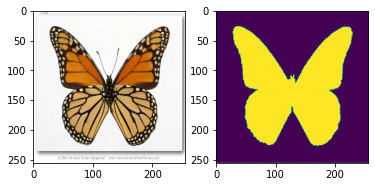

In [ ]:
## displaying data loaded by our function
plt.subplot(1,2,1)
plt.imshow(framObjTrain['img'][1])
plt.subplot(1,2,2)
plt.imshow(framObjTrain['mask'][1])
plt.show()

# Training

Fold -  1
Epoch 1/20
94/94 [==============================] - 22s 203ms/step - loss: 0.5840 - accuracy: 0.8417 - precision: 0.6794 - recall: 0.9013 - jaccard_coef: 0.4669
Epoch 2/20
94/94 [==============================] - 19s 203ms/step - loss: 0.5679 - accuracy: 0.8357 - precision: 0.6688 - recall: 0.8981 - jaccard_coef: 0.5863
Epoch 3/20
94/94 [==============================] - 19s 203ms/step - loss: 0.5605 - accuracy: 0.8373 - precision: 0.6712 - recall: 0.8997 - jaccard_coef: 0.6702
Epoch 4/20
94/94 [==============================] - 19s 203ms/step - loss: 0.5575 - accuracy: 0.8407 - precision: 0.6772 - recall: 0.9021 - jaccard_coef: 0.6989
Epoch 5/20
94/94 [==============================] - 19s 203ms/step - loss: 0.5562 - accuracy: 0.8445 - precision: 0.6838 - recall: 0.9049 - jaccard_coef: 0.7217
Epoch 6/20
94/94 [==============================] - 19s 203ms/step - loss: 0.5563 - accuracy: 0.8482 - precision: 0.6905 - recall: 0.9073 - jaccard_coef: 0.7293
Epoch 7/20
94/94 [======

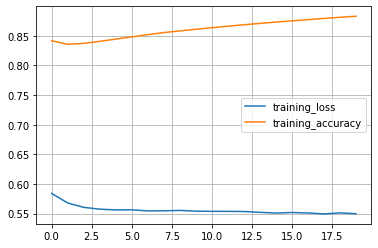

Fold -  2
Epoch 1/20
94/94 [==============================] - 22s 203ms/step - loss: 0.5757 - accuracy: 0.8814 - precision: 0.7536 - recall: 0.9293 - jaccard_coef: 0.5205
Epoch 2/20
94/94 [==============================] - 19s 203ms/step - loss: 0.5657 - accuracy: 0.8796 - precision: 0.7499 - recall: 0.9279 - jaccard_coef: 0.6118
Epoch 3/20
94/94 [==============================] - 19s 204ms/step - loss: 0.5621 - accuracy: 0.8785 - precision: 0.7477 - recall: 0.9273 - jaccard_coef: 0.6416
Epoch 4/20
94/94 [==============================] - 19s 203ms/step - loss: 0.5597 - accuracy: 0.8779 - precision: 0.7466 - recall: 0.9272 - jaccard_coef: 0.6674
Epoch 5/20
94/94 [==============================] - 19s 203ms/step - loss: 0.5590 - accuracy: 0.8777 - precision: 0.7463 - recall: 0.9272 - jaccard_coef: 0.6792
Epoch 6/20
94/94 [==============================] - 19s 203ms/step - loss: 0.5558 - accuracy: 0.8779 - precision: 0.7465 - recall: 0.9274 - jaccard_coef: 0.7188
Epoch 7/20
94/94 [======

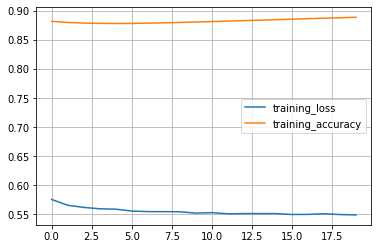

Fold -  3
Epoch 1/20
94/94 [==============================] - 23s 217ms/step - loss: 0.5770 - accuracy: 0.8873 - precision: 0.7658 - recall: 0.9338 - jaccard_coef: 0.5004
Epoch 2/20
94/94 [==============================] - 19s 204ms/step - loss: 0.5623 - accuracy: 0.8858 - precision: 0.7626 - recall: 0.9333 - jaccard_coef: 0.6323
Epoch 3/20
94/94 [==============================] - 19s 203ms/step - loss: 0.5601 - accuracy: 0.8853 - precision: 0.7616 - recall: 0.9330 - jaccard_coef: 0.6646
Epoch 4/20
94/94 [==============================] - 19s 203ms/step - loss: 0.5569 - accuracy: 0.8851 - precision: 0.7612 - recall: 0.9329 - jaccard_coef: 0.6973
Epoch 5/20
94/94 [==============================] - 19s 204ms/step - loss: 0.5578 - accuracy: 0.8850 - precision: 0.7611 - recall: 0.9329 - jaccard_coef: 0.6970
Epoch 6/20
94/94 [==============================] - 19s 204ms/step - loss: 0.5551 - accuracy: 0.8851 - precision: 0.7612 - recall: 0.9329 - jaccard_coef: 0.7212
Epoch 7/20
94/94 [======

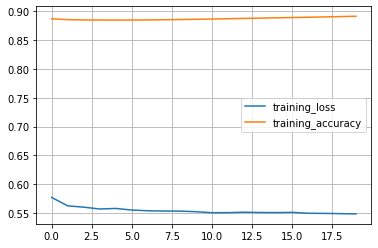

Fold -  4
Epoch 1/20
94/94 [==============================] - 22s 203ms/step - loss: 0.5772 - accuracy: 0.8909 - precision: 0.7734 - recall: 0.9362 - jaccard_coef: 0.4948
Epoch 2/20
94/94 [==============================] - 19s 203ms/step - loss: 0.5619 - accuracy: 0.8897 - precision: 0.7709 - recall: 0.9357 - jaccard_coef: 0.6195
Epoch 3/20
94/94 [==============================] - 19s 204ms/step - loss: 0.5574 - accuracy: 0.8892 - precision: 0.7699 - recall: 0.9355 - jaccard_coef: 0.6748
Epoch 4/20
94/94 [==============================] - 19s 204ms/step - loss: 0.5573 - accuracy: 0.8890 - precision: 0.7695 - recall: 0.9353 - jaccard_coef: 0.6777
Epoch 5/20
94/94 [==============================] - 19s 204ms/step - loss: 0.5564 - accuracy: 0.8888 - precision: 0.7692 - recall: 0.9352 - jaccard_coef: 0.6942
Epoch 6/20
94/94 [==============================] - 19s 203ms/step - loss: 0.5536 - accuracy: 0.8888 - precision: 0.7691 - recall: 0.9352 - jaccard_coef: 0.7242
Epoch 7/20
94/94 [======

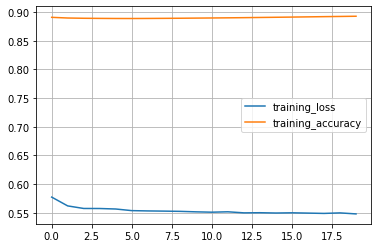

Fold -  5
Epoch 1/20
94/94 [==============================] - 22s 204ms/step - loss: 0.5762 - accuracy: 0.8922 - precision: 0.7766 - recall: 0.9369 - jaccard_coef: 0.5175
Epoch 2/20
94/94 [==============================] - 19s 204ms/step - loss: 0.5643 - accuracy: 0.8914 - precision: 0.7748 - recall: 0.9366 - jaccard_coef: 0.6294
Epoch 3/20
94/94 [==============================] - 19s 204ms/step - loss: 0.5610 - accuracy: 0.8911 - precision: 0.7740 - recall: 0.9365 - jaccard_coef: 0.6671
Epoch 4/20
94/94 [==============================] - 19s 204ms/step - loss: 0.5601 - accuracy: 0.8909 - precision: 0.7736 - recall: 0.9364 - jaccard_coef: 0.6833
Epoch 5/20
94/94 [==============================] - 19s 203ms/step - loss: 0.5587 - accuracy: 0.8908 - precision: 0.7734 - recall: 0.9363 - jaccard_coef: 0.7020
Epoch 6/20
94/94 [==============================] - 19s 204ms/step - loss: 0.5570 - accuracy: 0.8907 - precision: 0.7733 - recall: 0.9363 - jaccard_coef: 0.7206
Epoch 7/20
94/94 [======

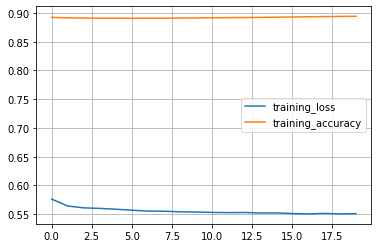

Fold -  6
Epoch 1/20
94/94 [==============================] - 22s 204ms/step - loss: 0.5783 - accuracy: 0.8936 - precision: 0.7794 - recall: 0.9379 - jaccard_coef: 0.5079
Epoch 2/20
94/94 [==============================] - 19s 204ms/step - loss: 0.5648 - accuracy: 0.8930 - precision: 0.7780 - recall: 0.9375 - jaccard_coef: 0.6277
Epoch 3/20
94/94 [==============================] - 19s 204ms/step - loss: 0.5622 - accuracy: 0.8927 - precision: 0.7774 - recall: 0.9372 - jaccard_coef: 0.6564
Epoch 4/20
94/94 [==============================] - 19s 204ms/step - loss: 0.5598 - accuracy: 0.8925 - precision: 0.7769 - recall: 0.9371 - jaccard_coef: 0.6759
Epoch 5/20
94/94 [==============================] - 19s 204ms/step - loss: 0.5580 - accuracy: 0.8924 - precision: 0.7767 - recall: 0.9370 - jaccard_coef: 0.7037
Epoch 6/20
94/94 [==============================] - 19s 204ms/step - loss: 0.5562 - accuracy: 0.8923 - precision: 0.7766 - recall: 0.9369 - jaccard_coef: 0.7241
Epoch 7/20
94/94 [======

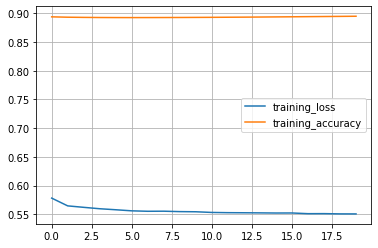

Fold -  7
Epoch 1/20
94/94 [==============================] - 22s 204ms/step - loss: 0.5753 - accuracy: 0.8942 - precision: 0.7806 - recall: 0.9380 - jaccard_coef: 0.5056
Epoch 2/20
94/94 [==============================] - 19s 204ms/step - loss: 0.5612 - accuracy: 0.8936 - precision: 0.7793 - recall: 0.9378 - jaccard_coef: 0.6284
Epoch 3/20
94/94 [==============================] - 19s 204ms/step - loss: 0.5593 - accuracy: 0.8933 - precision: 0.7787 - recall: 0.9376 - jaccard_coef: 0.6562
Epoch 4/20
94/94 [==============================] - 19s 204ms/step - loss: 0.5564 - accuracy: 0.8931 - precision: 0.7783 - recall: 0.9375 - jaccard_coef: 0.6893
Epoch 5/20
94/94 [==============================] - 19s 204ms/step - loss: 0.5544 - accuracy: 0.8931 - precision: 0.7782 - recall: 0.9375 - jaccard_coef: 0.7070
Epoch 6/20
94/94 [==============================] - 19s 204ms/step - loss: 0.5542 - accuracy: 0.8930 - precision: 0.7781 - recall: 0.9374 - jaccard_coef: 0.7166
Epoch 7/20
94/94 [======

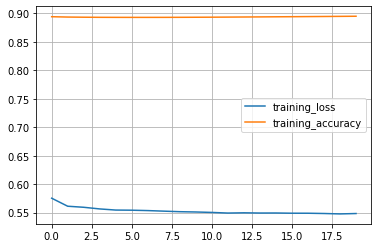

Fold -  8
Epoch 1/20
94/94 [==============================] - 22s 204ms/step - loss: 0.5722 - accuracy: 0.8947 - precision: 0.7818 - recall: 0.9384 - jaccard_coef: 0.5410
Epoch 2/20
94/94 [==============================] - 19s 204ms/step - loss: 0.5607 - accuracy: 0.8943 - precision: 0.7809 - recall: 0.9382 - jaccard_coef: 0.6499
Epoch 3/20
94/94 [==============================] - 19s 205ms/step - loss: 0.5578 - accuracy: 0.8941 - precision: 0.7806 - recall: 0.9381 - jaccard_coef: 0.6840
Epoch 4/20
94/94 [==============================] - 19s 204ms/step - loss: 0.5557 - accuracy: 0.8940 - precision: 0.7804 - recall: 0.9380 - jaccard_coef: 0.7139
Epoch 5/20
94/94 [==============================] - 19s 204ms/step - loss: 0.5542 - accuracy: 0.8940 - precision: 0.7804 - recall: 0.9380 - jaccard_coef: 0.7314
Epoch 6/20
94/94 [==============================] - 19s 204ms/step - loss: 0.5533 - accuracy: 0.8941 - precision: 0.7806 - recall: 0.9380 - jaccard_coef: 0.7440
Epoch 7/20
94/94 [======

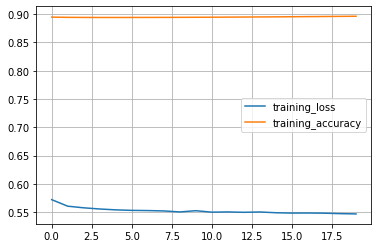

Fold -  9
Epoch 1/20
94/94 [==============================] - 22s 205ms/step - loss: 0.5803 - accuracy: 0.8958 - precision: 0.7843 - recall: 0.9391 - jaccard_coef: 0.4746
Epoch 2/20
94/94 [==============================] - 19s 204ms/step - loss: 0.5653 - accuracy: 0.8952 - precision: 0.7830 - recall: 0.9387 - jaccard_coef: 0.5986
Epoch 3/20
94/94 [==============================] - 19s 204ms/step - loss: 0.5604 - accuracy: 0.8949 - precision: 0.7824 - recall: 0.9386 - jaccard_coef: 0.6420
Epoch 4/20
94/94 [==============================] - 19s 205ms/step - loss: 0.5578 - accuracy: 0.8947 - precision: 0.7820 - recall: 0.9385 - jaccard_coef: 0.6811
Epoch 5/20
94/94 [==============================] - 19s 205ms/step - loss: 0.5578 - accuracy: 0.8946 - precision: 0.7818 - recall: 0.9384 - jaccard_coef: 0.6855
Epoch 6/20
94/94 [==============================] - 19s 204ms/step - loss: 0.5559 - accuracy: 0.8945 - precision: 0.7816 - recall: 0.9383 - jaccard_coef: 0.6976
Epoch 7/20
94/94 [======

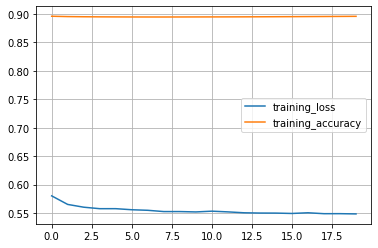

Fold -  10
Epoch 1/20
94/94 [==============================] - 22s 205ms/step - loss: 0.5770 - accuracy: 0.8953 - precision: 0.7834 - recall: 0.9389 - jaccard_coef: 0.5191
Epoch 2/20
94/94 [==============================] - 19s 205ms/step - loss: 0.5627 - accuracy: 0.8950 - precision: 0.7826 - recall: 0.9387 - jaccard_coef: 0.6467
Epoch 3/20
94/94 [==============================] - 19s 205ms/step - loss: 0.5619 - accuracy: 0.8948 - precision: 0.7822 - recall: 0.9386 - jaccard_coef: 0.6650
Epoch 4/20
94/94 [==============================] - 19s 204ms/step - loss: 0.5594 - accuracy: 0.8947 - precision: 0.7820 - recall: 0.9386 - jaccard_coef: 0.6888
Epoch 5/20
94/94 [==============================] - 19s 204ms/step - loss: 0.5578 - accuracy: 0.8947 - precision: 0.7819 - recall: 0.9385 - jaccard_coef: 0.7078
Epoch 6/20
94/94 [==============================] - 19s 204ms/step - loss: 0.5569 - accuracy: 0.8947 - precision: 0.7819 - recall: 0.9385 - jaccard_coef: 0.7221
Epoch 7/20
94/94 [=====

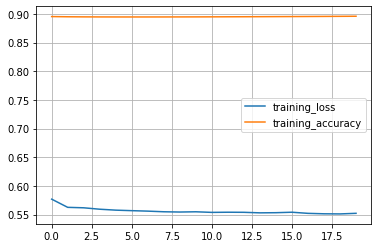

In [ ]:
AVERAGE_ACCURACY_TRAIN = []
AVERAGE_JACCARD_TRAIN = []
AVERAGE_RECALL_TRAIN = []
AVERAGE_PRECISION_TRAIN = []

AVERAGE_ACCURACY_TEST = []
AVERAGE_JACCARD_TEST = []
AVERAGE_RECALL_TEST = []
AVERAGE_PRECISION_TEST = []
save_dir = 'saved_models/'

def get_model_name(k):
    return 'model_'+str(k)+'.h5'

#K-CROSS VALIDATION
X = np.array(framObjTrain['img'])
Y = np.array(framObjTrain['mask'])
kf = KFold(n_splits = 10, shuffle=True, random_state=8)                 
i = 1
for train_index, val_index in kf.split(X, Y):
  print("Fold - ", i)
  training_data = X[train_index]
  label_training = Y[train_index]
  testing_data = X[val_index]
  label_testing = Y[val_index]
  
  inputs = tf.keras.layers.Input((256, 256, 3))
  model = GiveMeDEnet(inputs, droupouts= 0.07) # GiveMeUnet ; GiveMeDEnet ; GiveMeUnetWithVGG
  opt = tf.keras.optimizers.Adam(learning_rate=0.01)
  model.compile(optimizer = opt, loss = dice_loss, metrics = METRICS)

  checkpoint = tf.keras.callbacks.ModelCheckpoint(save_dir+get_model_name(i), 
							monitor='val_accuracy', verbose=1, 
							save_best_only=True, mode='max')
	
  callbacks_list = [checkpoint]

  retVal = model.fit(training_data, label_training, epochs = 20, verbose = 1, batch_size=8)

  AVERAGE_ACCURACY_TRAIN.append(np.mean(retVal.history['accuracy']))
  AVERAGE_RECALL_TRAIN.append(np.mean(retVal.history['recall']))
  AVERAGE_JACCARD_TRAIN.append(np.mean(retVal.history['jaccard_coef']))
  AVERAGE_PRECISION_TRAIN.append(np.mean(retVal.history['precision']))

  plt.plot(retVal.history['loss'], label = 'training_loss')
  plt.plot(retVal.history['accuracy'], label = 'training_accuracy')
  plt.legend()
  plt.grid(True)
  plt.show()

  i = i + 1

  # evaluate the model
  loss, accuracy, precision, recall, jaccard = model.evaluate(testing_data, label_testing, verbose=0, batch_size=8)

  AVERAGE_ACCURACY_TEST.append(np.mean(accuracy))
  AVERAGE_JACCARD_TEST.append(np.mean(jaccard))
  AVERAGE_RECALL_TEST.append(np.mean(recall))
  AVERAGE_PRECISION_TEST.append(np.mean(precision))

In [ ]:
# history = model.fit(training_data, epochs=20, callbacks=callbacks_list, validation_data=label_training, batch_size=8)

In [ ]:
print("Accuracy Training : ", np.mean(AVERAGE_ACCURACY_TRAIN))
print("Jaccard Training : ", np.mean(AVERAGE_JACCARD_TRAIN))
print("Recall Training : ", np.mean(AVERAGE_RECALL_TRAIN))
print("Precision Training : ", np.mean(AVERAGE_PRECISION_TRAIN))

Accuracy Training :  0.8883900454640388
Jaccard Training :  0.7382467922568321
Recall Training :  0.9343260470032693
Precision Training :  0.768847134411335


0


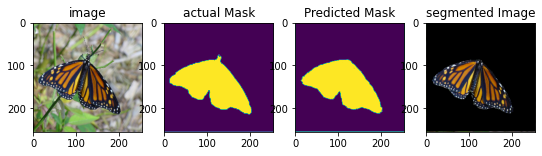

1


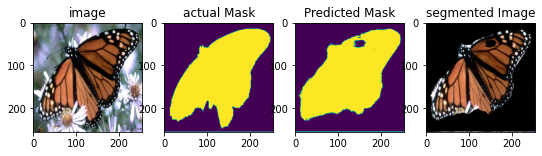

2


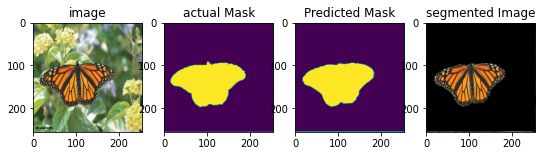

3


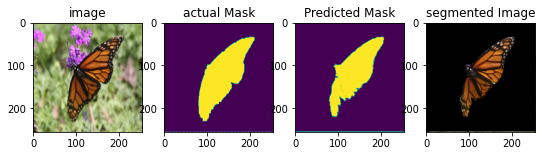

4


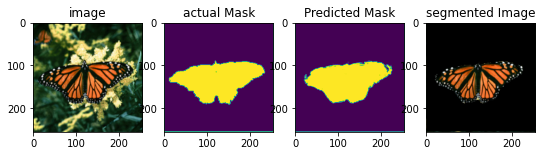

5


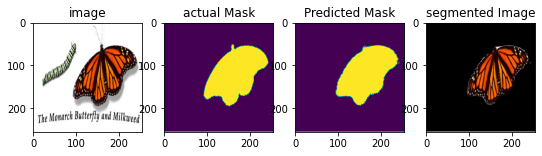

6


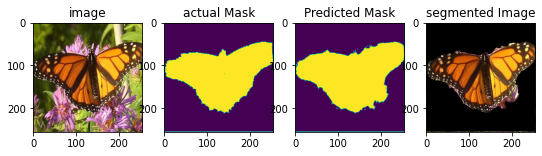

7


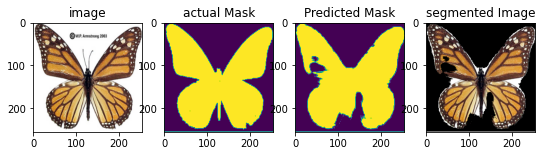

8


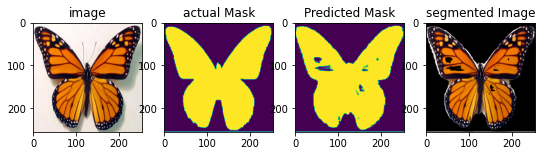

9


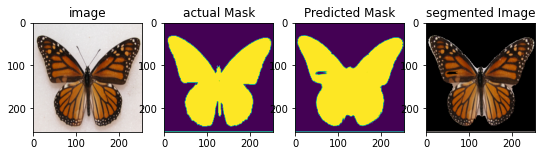

10


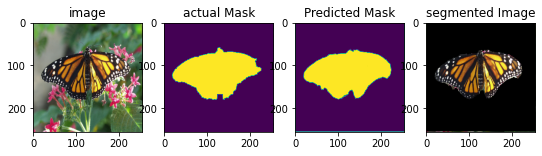

11


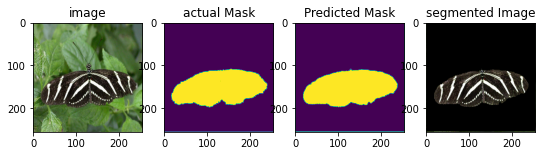

12


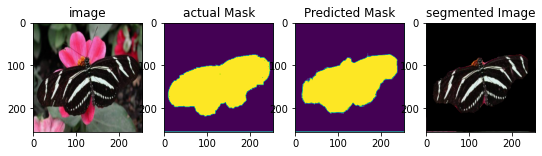

13


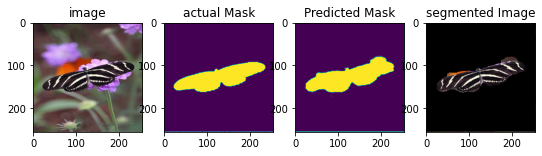

14


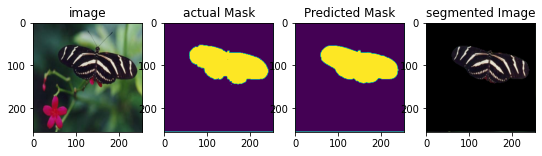

15


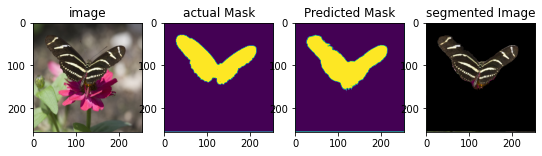

16


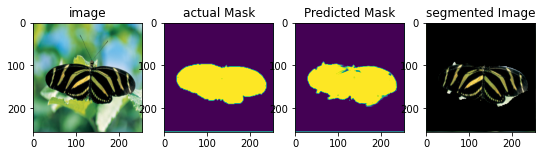

17


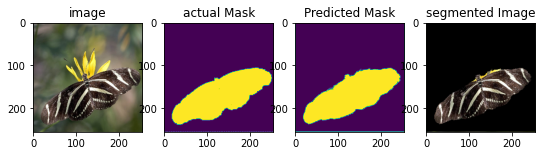

18


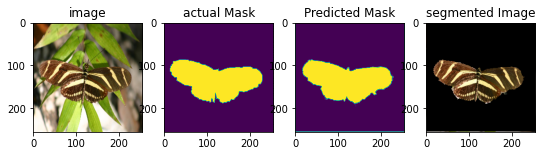

19


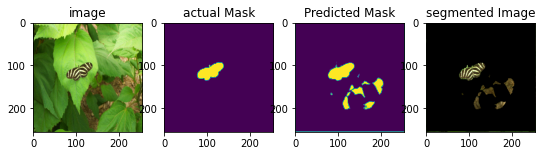

20


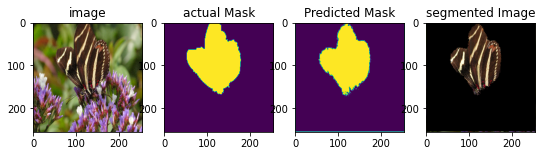

21


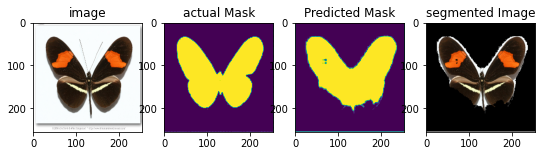

22


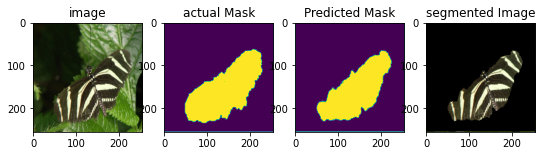

23


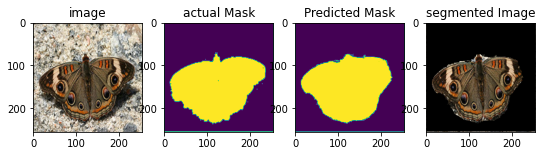

24


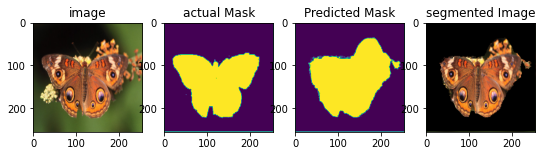

25


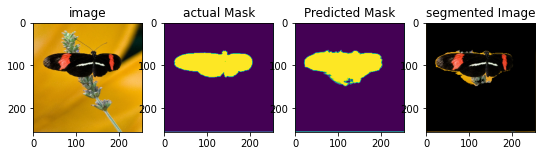

26


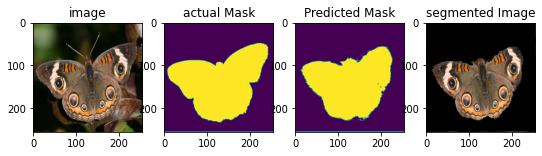

27


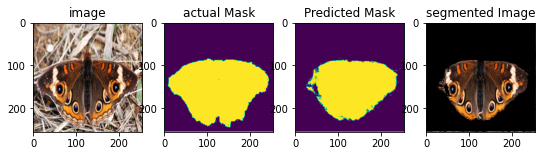

28


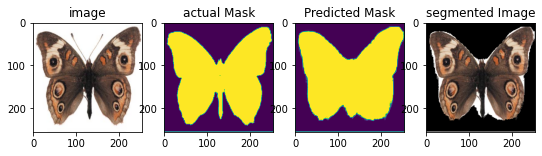

29


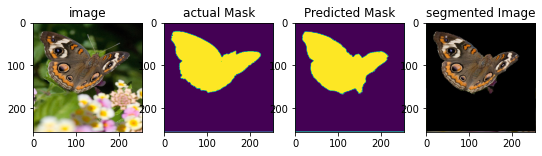

30


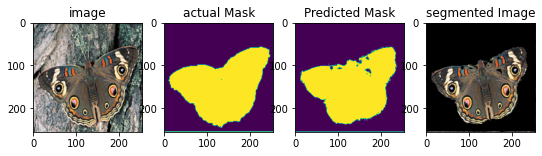

31


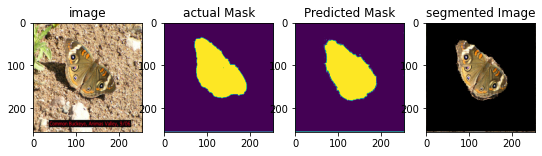

32


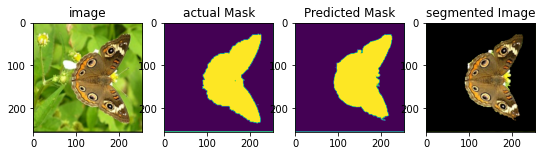

33


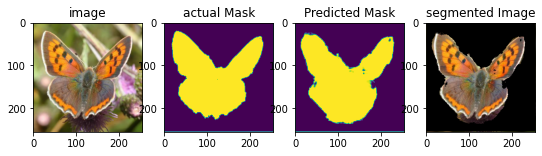

34


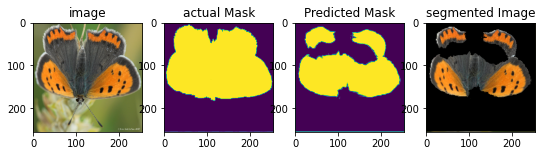

35


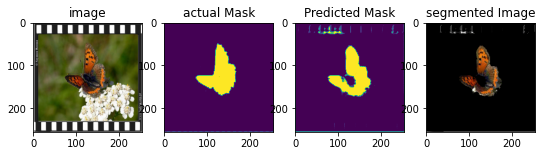

36


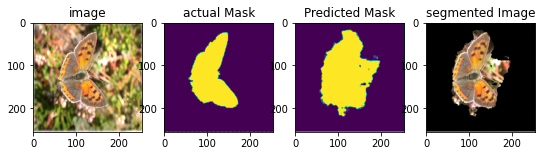

37


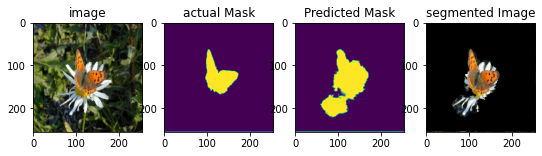

38


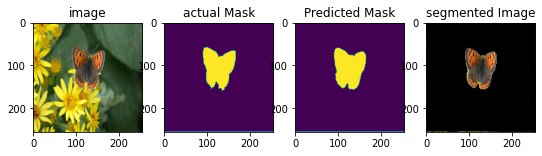

39


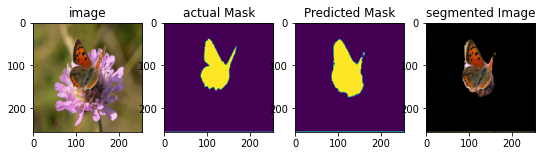

40


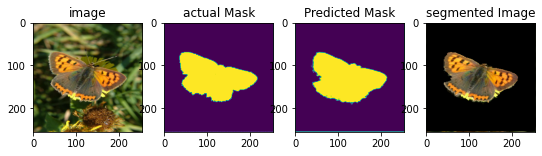

41


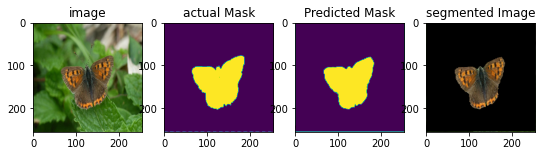

42


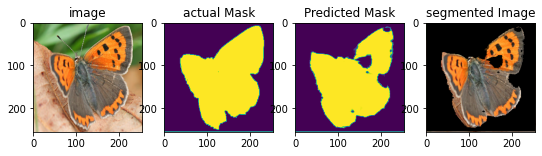

43


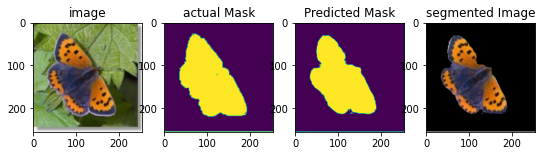

44


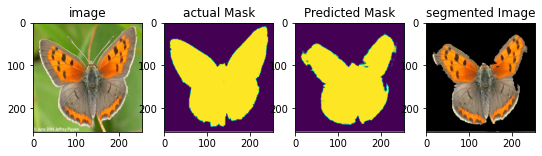

45


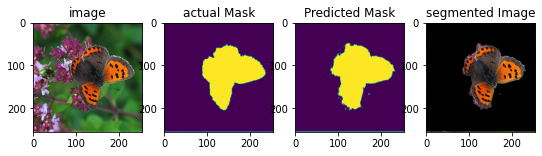

46


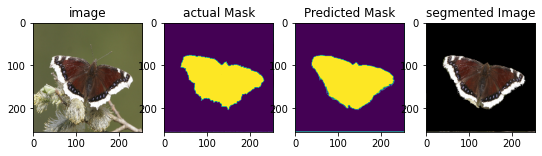

47


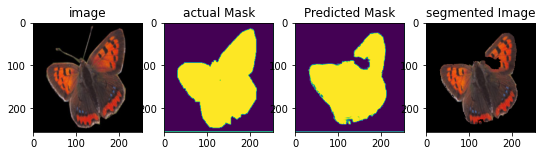

48


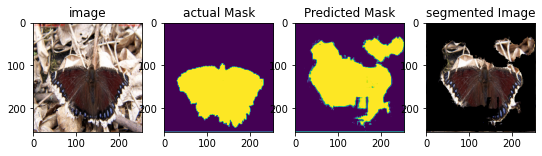

49


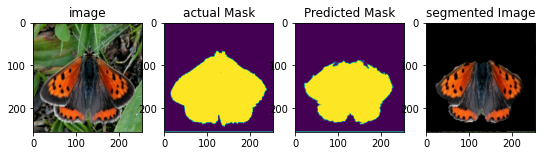

50


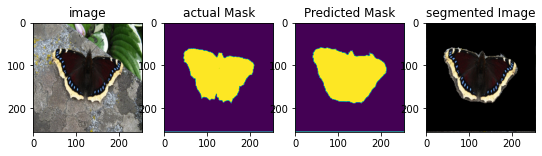

51


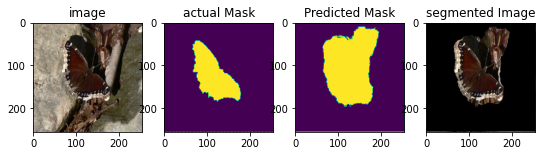

52


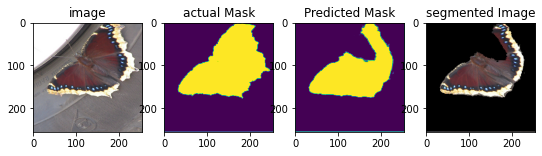

53


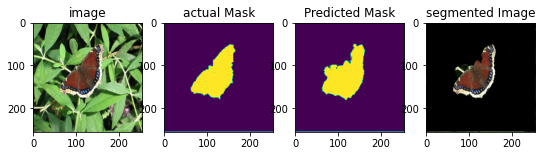

54


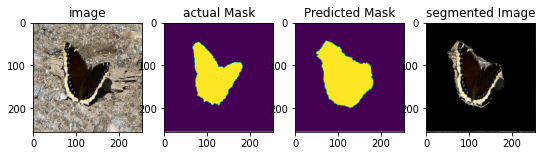

55


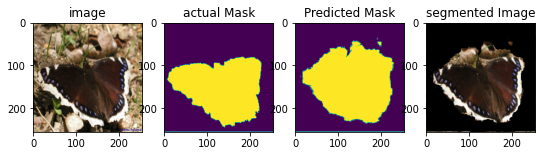

56


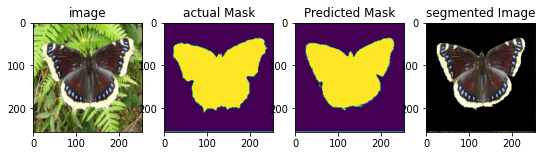

57


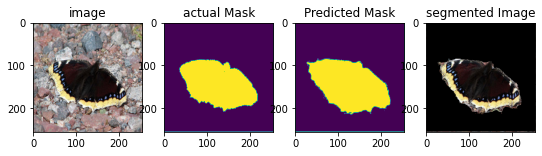

58


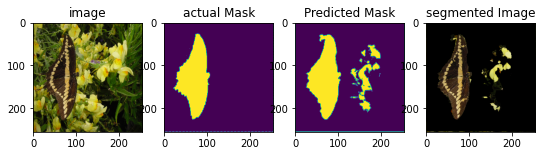

59


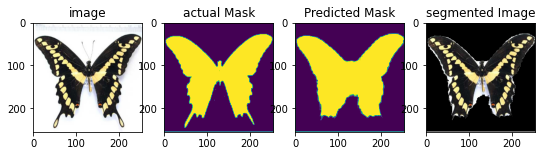

60


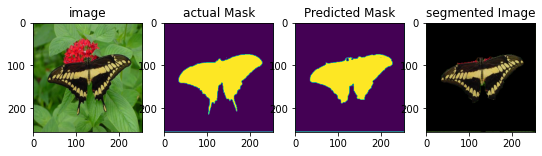

61


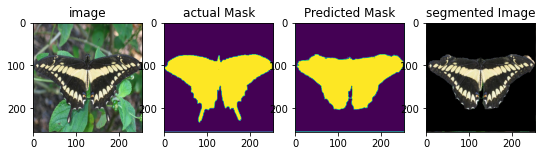

62


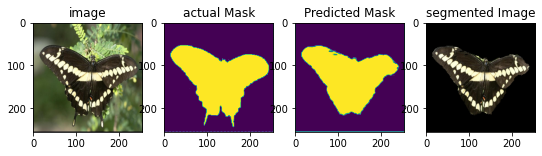

63


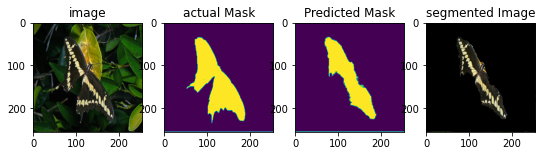

64


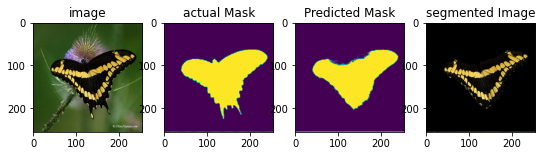

65


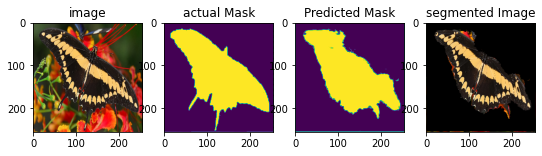

66


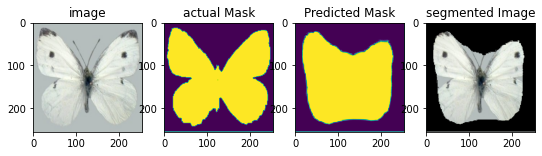

67


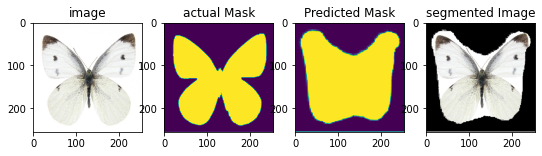

68


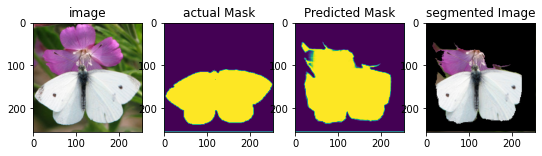

69


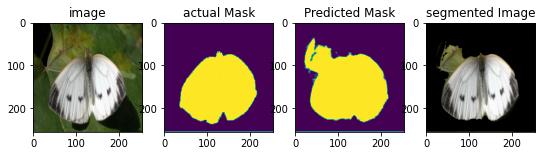

70


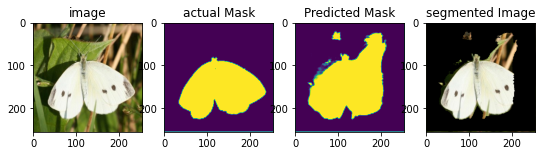

71


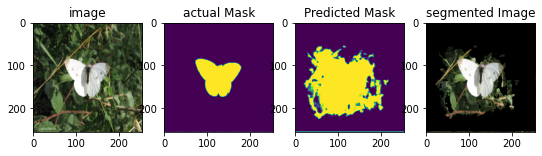

72


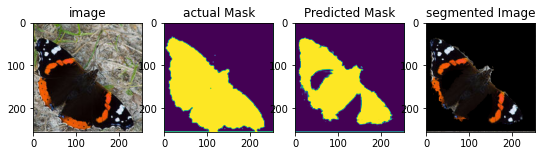

73


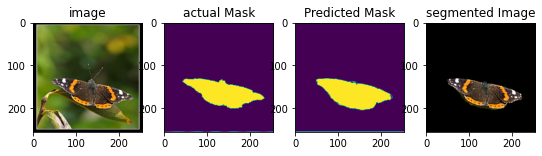

74


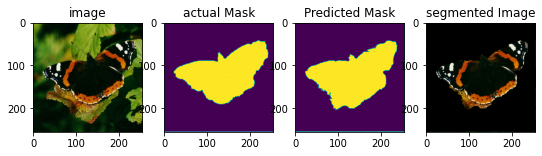

75


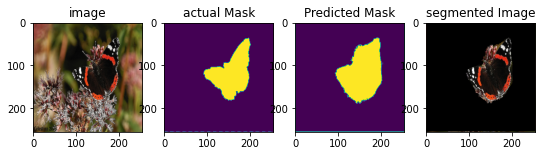

76


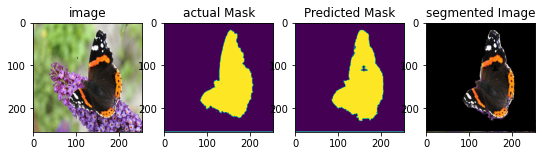

77


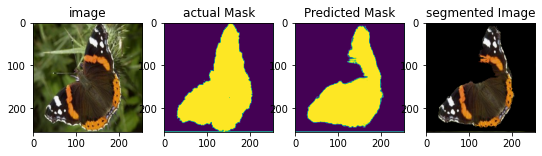

78


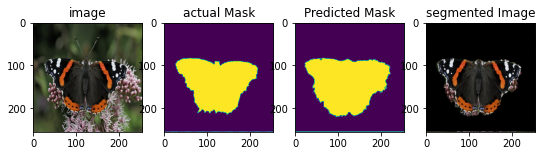

79


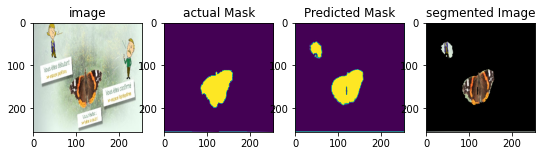

80


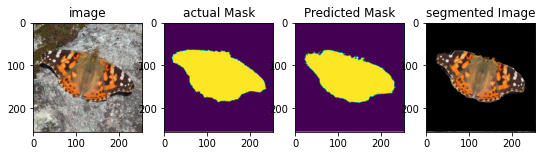

81


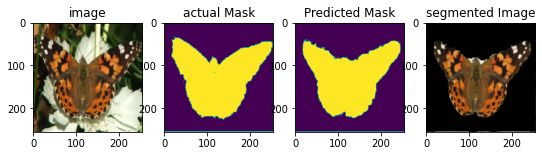

82


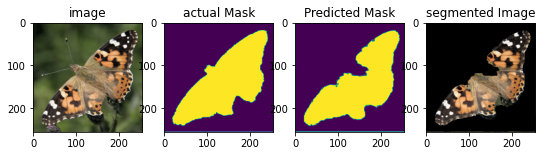

Rata-rata:  0.0011578147669872607


In [ ]:
# Hitung Waktu Segmentasi
time_list = []
for i in range(len(testing_data)):
  start = time.time()
  predictions_1 = model.predict(testing_data[i:(i+1)])
  end = time.time()
  duration = (end - start)/60
  time_list.append(duration)
  print(i)
  Plotter(testing_data[i], predictions_1[0][:,:,0], label_testing[i])
print("Rata-rata: ", np.mean(time_list))

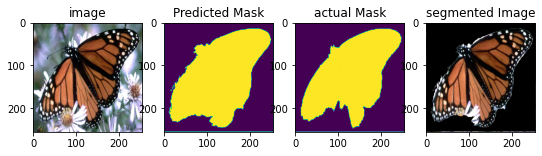

In [ ]:
# Testing 1 citra dan Visualisasi Hasil
predictions_1 = model.predict(testing_data[1:2])
Plotter(testing_data[1], predictions_1[0][:,:,0], label_testing[1])

In [ ]:
# tf.keras.utils.plot_model(model, show_shapes=True)

In [ ]:
# Save the entire model as a SavedModel.
# !mkdir -p saved_model
model.save('my_model_DE-Net')

# Experiment using another image (exclude dataset)

In [ ]:
img_1 = plt.imread('/content/gdrive/MyDrive/Colab Notebooks/Dataset/Kaggle/leedsbutterfly/Picture1.png')
img_1 = cv2.resize(img_1, (256, 256))
# plt.imshow(img_1)
a = cv2.cvtColor(img_1, cv2.COLOR_RGBA2RGB)
list_img_test =  np.array([a])

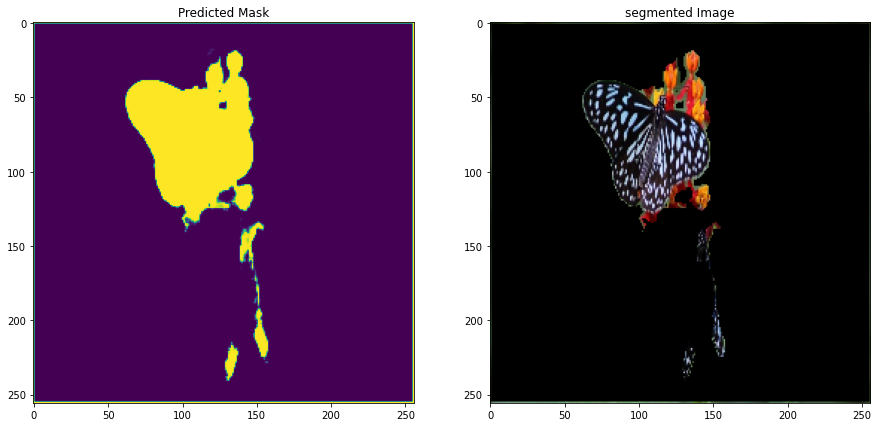

In [ ]:
predictions_1 = model.predict(list_img_test[0:1])
plt.figure(figsize=(15,15))  

plt.subplot(1,2,1)
plt.imshow(predictions_1[0][:,:,0]) #show 
plt.title('Predicted Mask')

imh = predictions_1[0][:,:,0]
imh[imh < 0.5] = 0
imh[imh > 0.5] = 1

plt.subplot(1,2,2)
plt.imshow(cv2.merge((imh, imh, imh)) * list_img_test[0])
plt.title('segmented Image')
plt.show()

# Demo

Epoch 1/10
94/94 [==============================] - 22s 204ms/step - loss: 0.5829 - accuracy: 0.8970 - precision: 0.7867 - recall: 0.9405 - jaccard_coef: 0.4624
Epoch 2/10
94/94 [==============================] - 19s 204ms/step - loss: 0.5648 - accuracy: 0.8965 - precision: 0.7856 - recall: 0.9403 - jaccard_coef: 0.6294
Epoch 3/10
94/94 [==============================] - 19s 204ms/step - loss: 0.5607 - accuracy: 0.8964 - precision: 0.7852 - recall: 0.9402 - jaccard_coef: 0.6704
Epoch 4/10
94/94 [==============================] - 19s 204ms/step - loss: 0.5587 - accuracy: 0.8963 - precision: 0.7850 - recall: 0.9402 - jaccard_coef: 0.6950
Epoch 5/10
94/94 [==============================] - 19s 204ms/step - loss: 0.5580 - accuracy: 0.8962 - precision: 0.7849 - recall: 0.9401 - jaccard_coef: 0.7096
Epoch 6/10
94/94 [==============================] - 19s 204ms/step - loss: 0.5573 - accuracy: 0.8962 - precision: 0.7848 - recall: 0.9401 - jaccard_coef: 0.7245
Epoch 7/10
94/94 [================

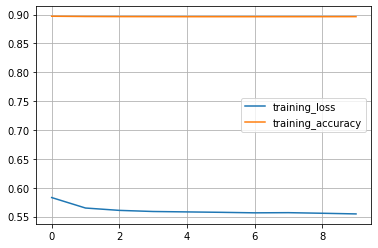

In [ ]:
inputs = tf.keras.layers.Input((256, 256, 3))
model_1 = GiveMeDEnet(inputs, droupouts= 0.07) # GiveMeUnet ; GiveMeDEnet ; GiveMeUnetWithVGG

opt = tf.keras.optimizers.Adam(learning_rate=0.01)
model_1.compile(optimizer = opt, loss = dice_loss, metrics = METRICS)

retVal = model_1.fit(training_data, label_training, epochs = 10, verbose = 1, batch_size=8)

AVERAGE_ACCURACY_TRAIN.append(np.mean(retVal.history['accuracy']))
AVERAGE_RECALL_TRAIN.append(np.mean(retVal.history['recall']))
AVERAGE_JACCARD_TRAIN.append(np.mean(retVal.history['jaccard_coef']))
AVERAGE_PRECISION_TRAIN.append(np.mean(retVal.history['precision']))

plt.plot(retVal.history['loss'], label = 'training_loss')
plt.plot(retVal.history['accuracy'], label = 'training_accuracy')
plt.legend()
plt.grid(True)
plt.show()

loss, accuracy, precision, recall, jaccard = model.evaluate(testing_data, label_testing, verbose=0, batch_size=8)

AVERAGE_ACCURACY_TEST.append(np.mean(accuracy))
AVERAGE_JACCARD_TEST.append(np.mean(jaccard))
AVERAGE_RECALL_TEST.append(np.mean(recall))
AVERAGE_PRECISION_TEST.append(np.mean(precision))

0


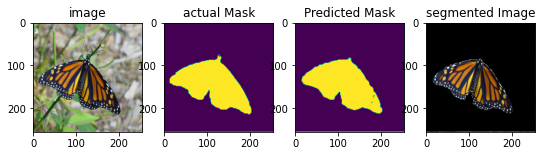

1


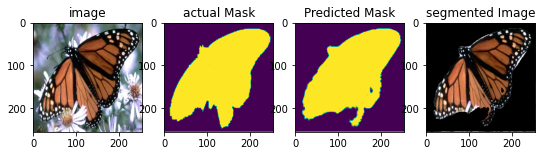

2


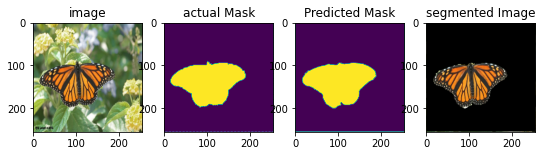

3


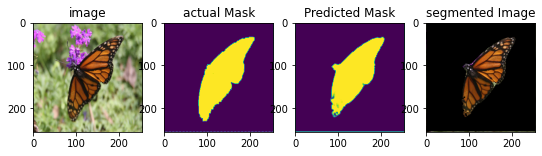

4


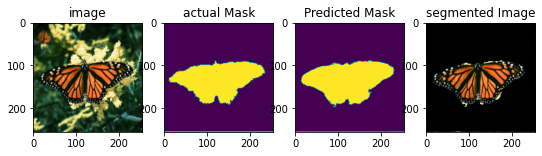

5


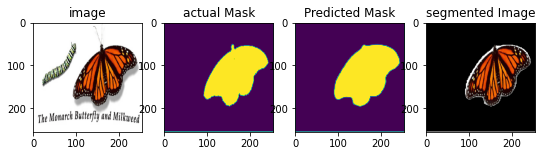

6


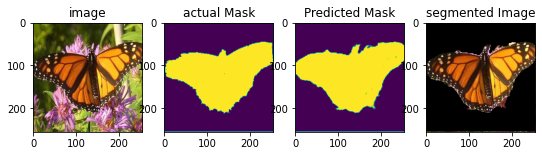

7


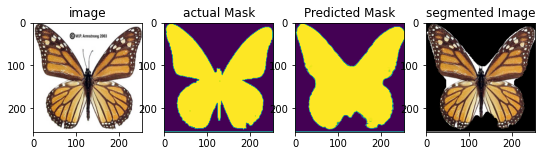

8


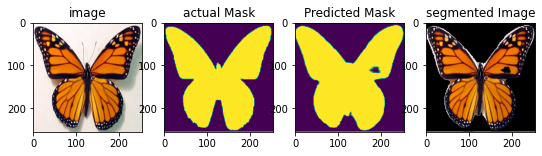

9


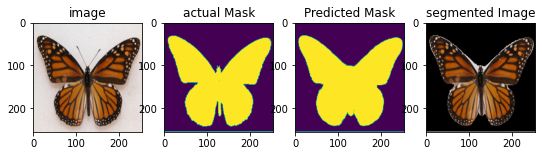

10


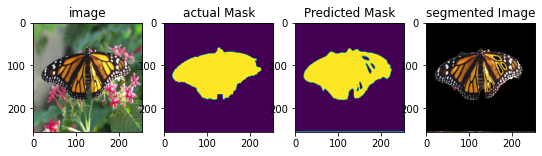

11


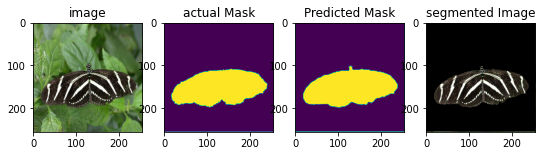

12


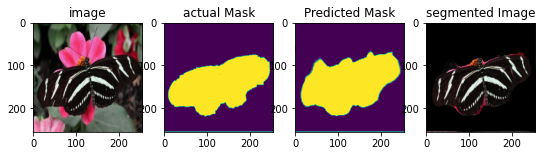

13


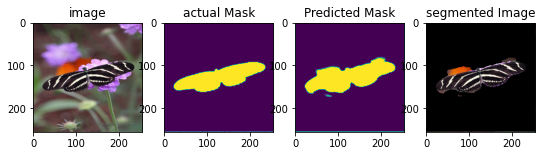

14


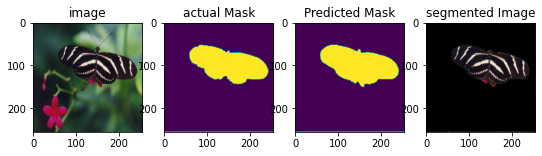

15


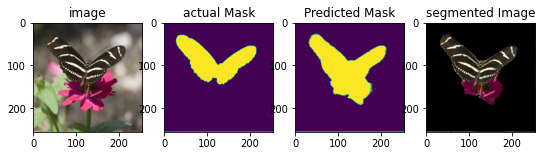

16


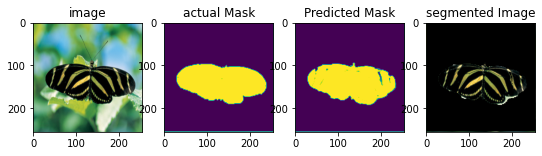

17


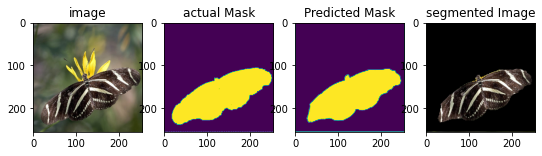

18


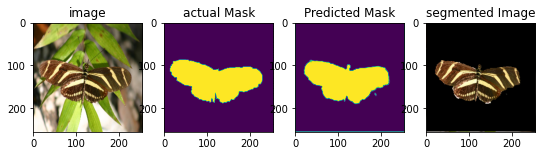

19


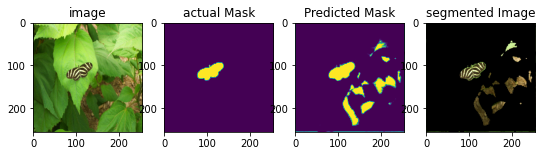

20


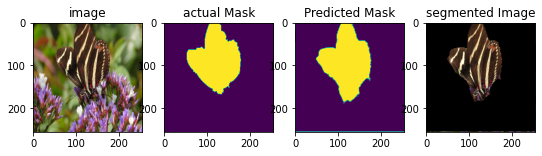

21


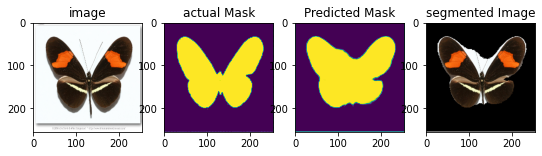

22


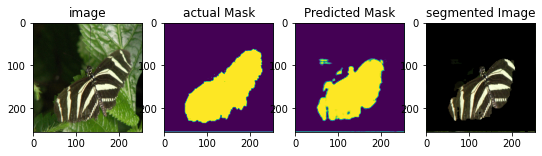

23


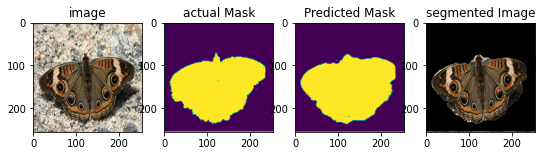

24


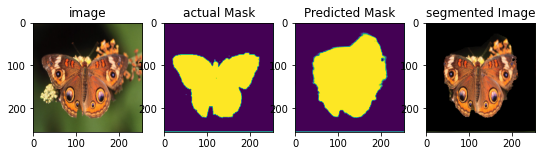

25


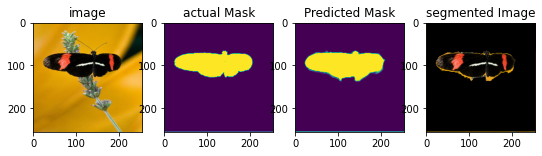

26


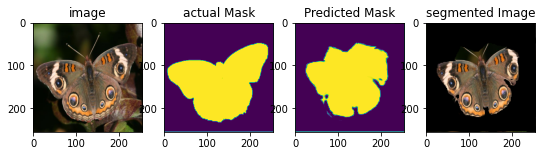

27


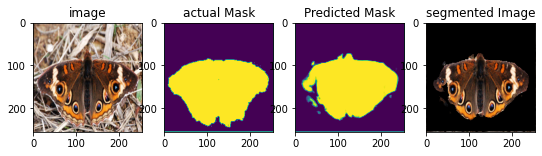

28


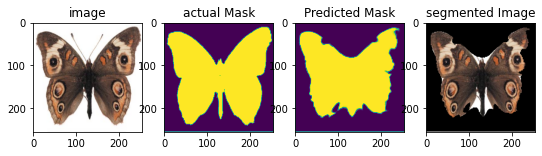

29


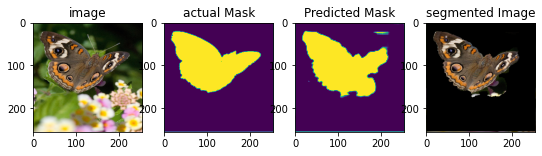

30


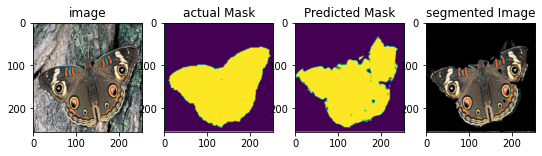

31


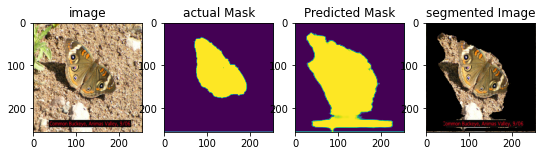

32


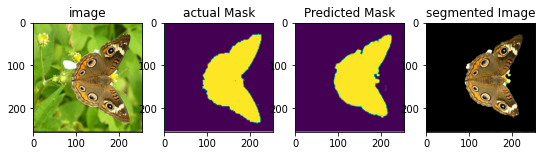

33


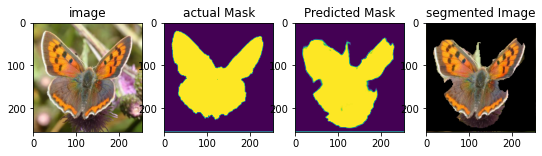

34


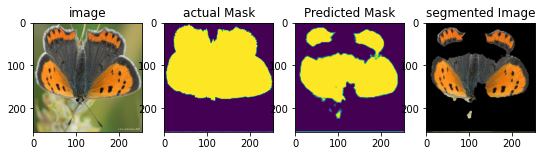

35


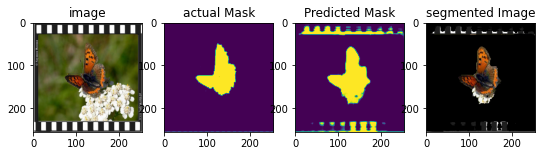

36


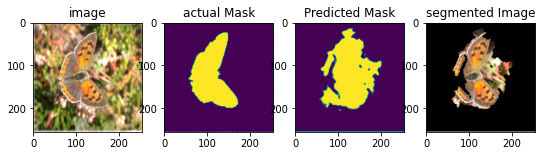

37


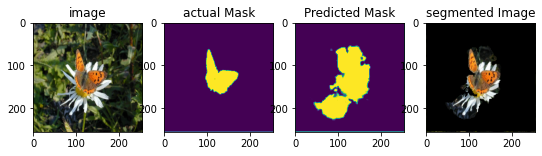

38


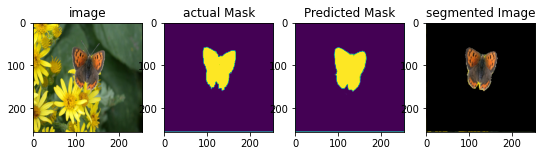

39


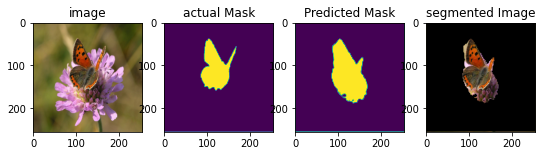

40


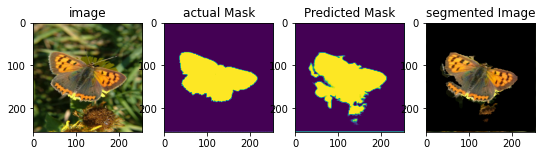

41


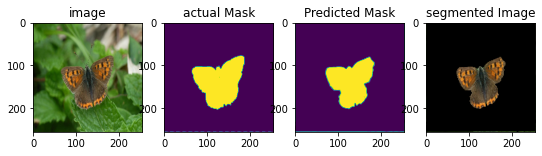

42


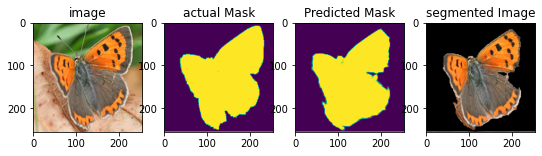

43


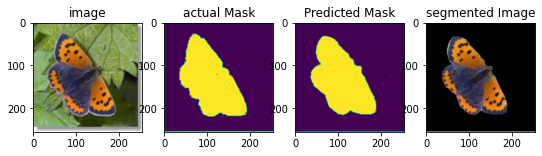

44


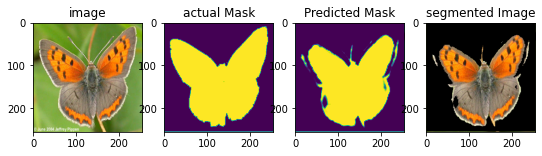

45


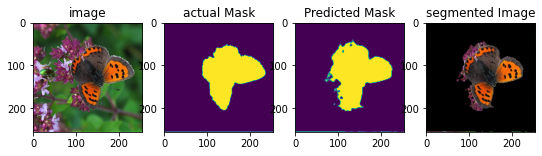

46


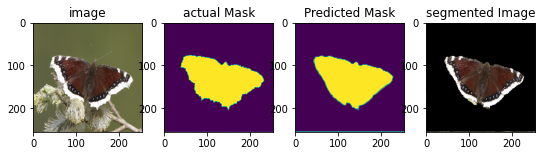

47


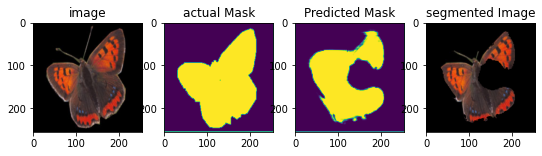

48


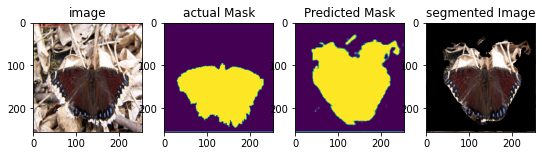

49


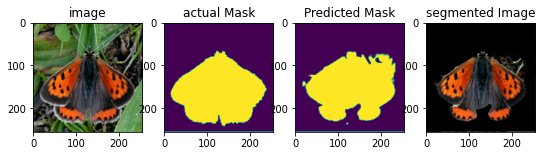

50


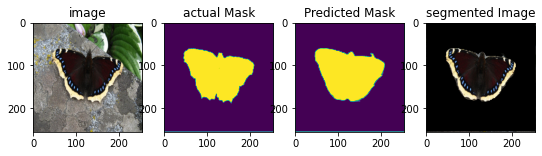

51


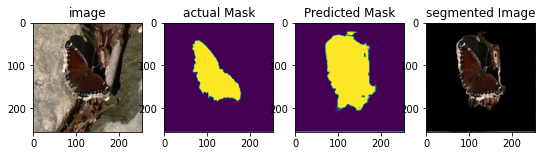

52


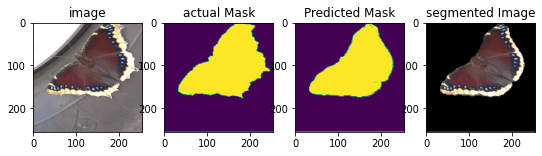

53


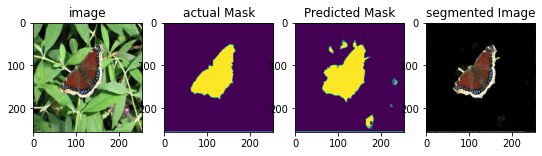

54


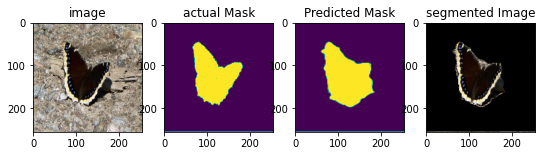

55


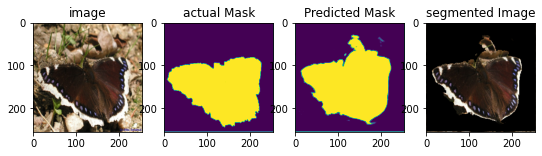

56


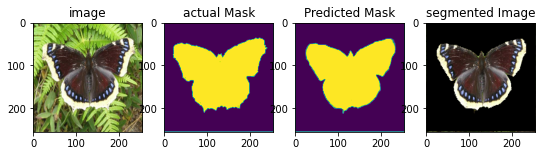

57


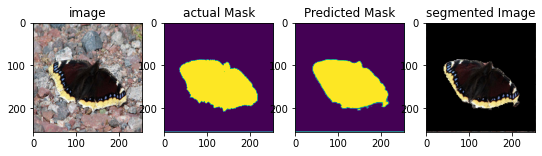

58


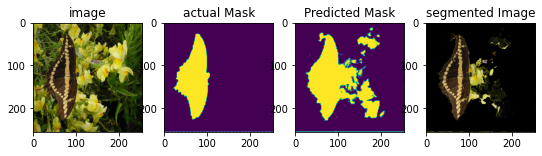

59


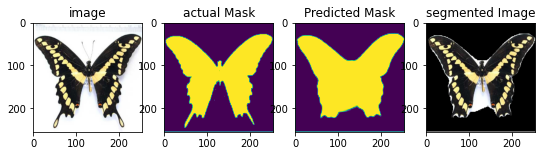

60


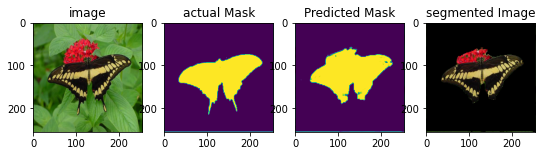

61


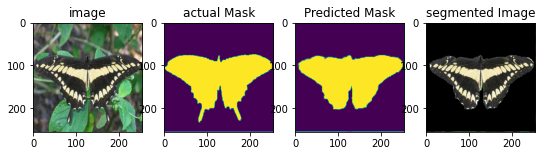

62


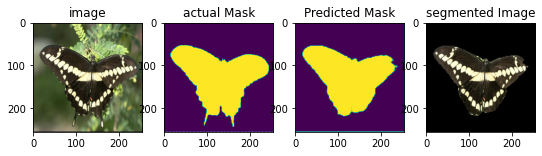

63


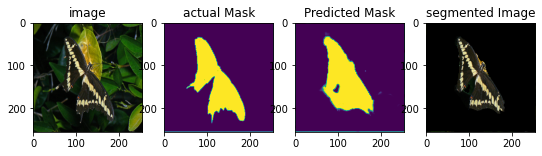

64


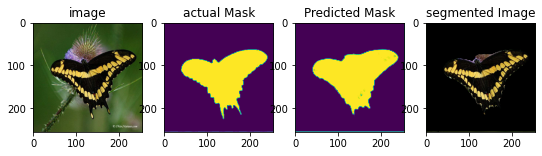

65


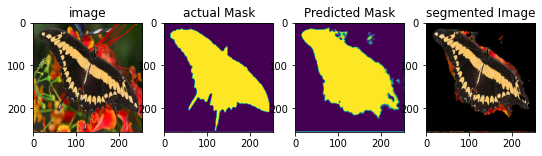

66


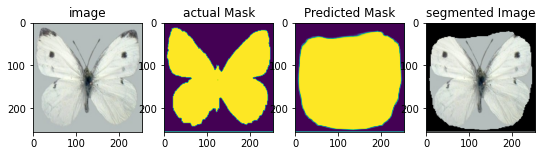

67


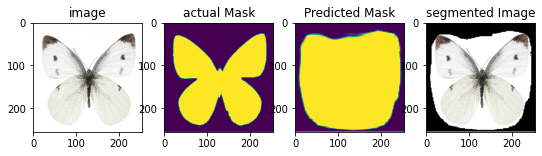

68


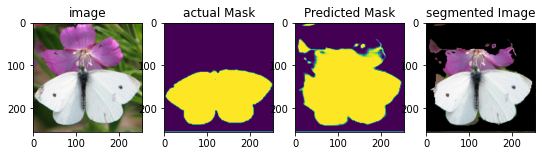

69


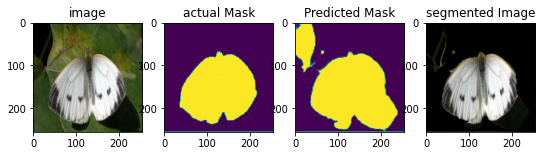

70


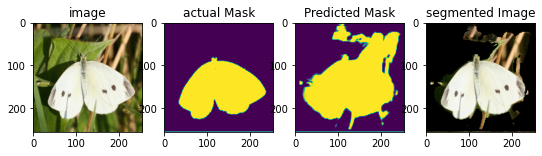

71


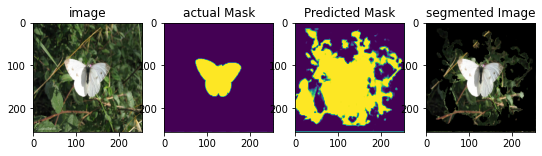

72


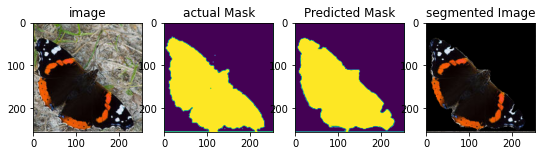

73


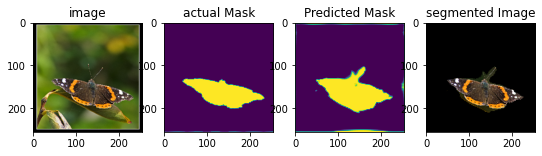

74


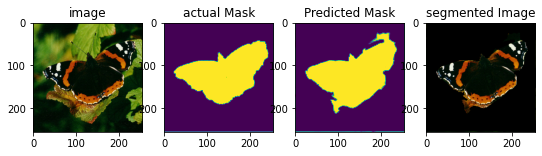

75


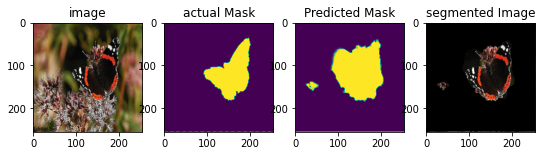

76


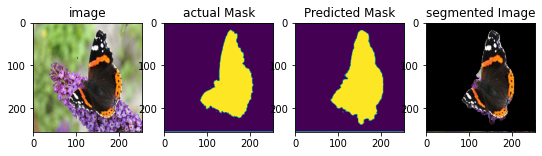

77


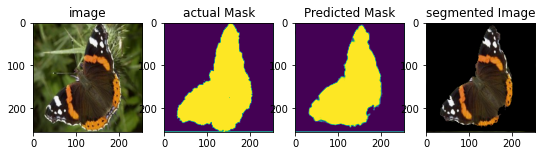

78


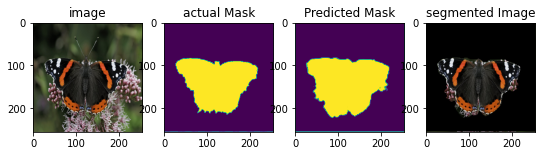

79


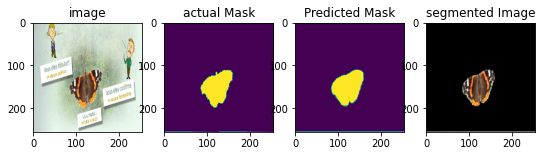

80


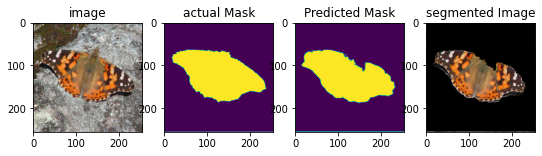

81


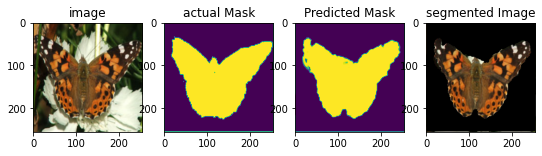

82


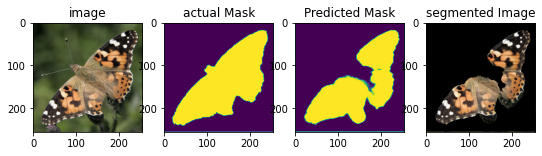

Rata-rata:  0.0011136521297286312


In [ ]:
# Count segmentation time
time_list = []
for i in range(len(testing_data)):
  start = time.time()
  predictions_demo = model_1.predict(testing_data[i:(i+1)])
  end = time.time()
  duration = (end - start)/60
  time_list.append(duration)
  print(i)
  Plotter(testing_data[i], predictions_demo[0][:,:,0], label_testing[i])
print("Rata-rata: ", np.mean(time_list))